In [83]:
import os
import json
import pandas as pd
from pprint import pprint

results_dir = "validated_jsons"

all_games = []
filenames = []
for file in os.listdir(results_dir):
    if file.endswith(".json"):
        with open(os.path.join(results_dir, file), "r") as f:
            data = json.load(f)
        if len(data["data"]["multi_player"]) > 1:
            all_games.append(data)
            filenames.append(file)

filenames[100]

'IMG_9685_rotated.json'

In [33]:
# Change all occurrences of "Evelyn" to "Evelien" in the multi_player column
for game in all_games:
    for i, player in enumerate(game["data"]["multi_player"]):
        if player.startswith("Evelyn"):
            game["data"]["multi_player"][i] = player.replace("Evelyn", "Evelien", 1)


In [34]:
# Combine all games into one DataFrame, adding a game_idx column to track the game source
dfs = []
for idx, game in enumerate(all_games):
    df = pd.DataFrame(game["data"])
    df["multi_player"] = df["multi_player"].map(lambda x: x.split(" ")[0])
    df["game_idx"] = idx
    dfs.append(df)
combined_df = pd.concat(dfs, ignore_index=True)
print(combined_df.head())


  multi_player  vogels  bonuskaarten  einde_ronde_doelen  eieren  \
0         Mama    40.0           6.0                 8.0     8.0   
1         Papa    37.0           3.0                11.0     6.0   
2      Evelien    35.0           2.0                15.0     6.0   
3         Mama    36.0           4.0                15.0     3.0   
4        Ellen    39.0           7.0                11.0     5.0   

   voedsel_op_kaarten  weggestopte_kaarten  totaal  game_idx  
0                 6.0                  7.0    75.0         0  
1                 1.0                  4.0    62.0         0  
2                 8.0                  3.0    69.0         0  
3                 7.0                  0.0    65.0         1  
4                11.0                  1.0    74.0         1  


In [35]:
combined_df.to_csv("combined_df.csv")

In [36]:
number_of_games = len(all_games)

number_of_wins_per_player = {player: 0 for player in combined_df["multi_player"].unique()}

for idx in range(number_of_games):
    each_game_df = combined_df[combined_df["game_idx"] == idx]
    won_column = each_game_df.iloc[each_game_df["totaal"].argmax()]
    number_of_wins_per_player[won_column["multi_player"]] += 1



/var/folders/rk/2mwt_wg11_g2pz5y3k4_j03h0000gn/T/ipykernel_28831/3596559141.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=players, y=games_played, palette=bar_colors)


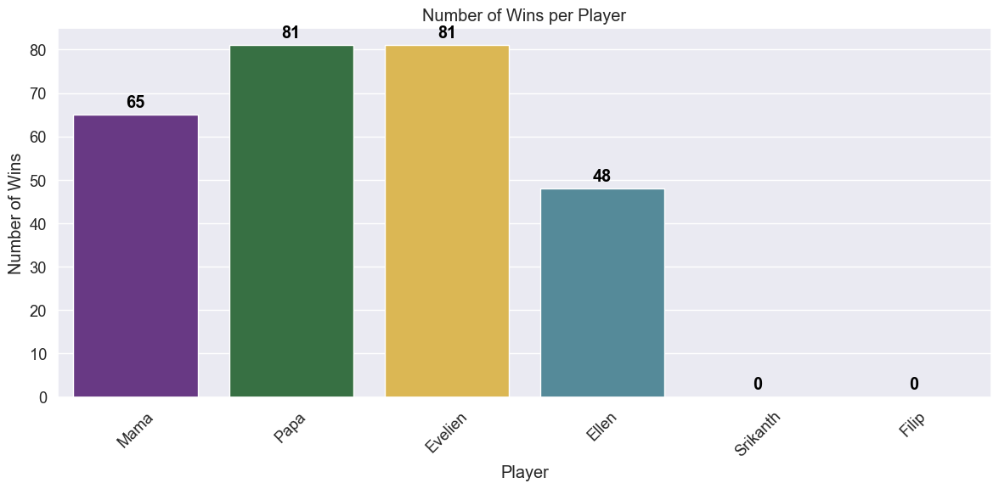

In [65]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define important players and their colors
important_players_colors = {
   'Mama': '#6b2c91',        # lighter purple
   'Papa': '#2d7a3e',        # muted green
   'Evelien': '#f2c23d',     # warm gold
   'Ellen': '#4a90a4',       # soft teal
   'Srikanth': '#8b4513',    # warm brown
   'Filip': '#6b4423',       # darker brown
}

players = []
games_played = []
bar_colors = []

for player, color in important_players_colors.items():
    if player in number_of_wins_per_player:
        players.append(player)
        games_played.append(number_of_wins_per_player[player])
        bar_colors.append(color)

plt.figure(figsize=(12, 6))
ax = sns.barplot(x=players, y=games_played, palette=bar_colors)
plt.xlabel("Player")
plt.ylabel("Number of Wins")
plt.title("Number of Wins per Player")
plt.xticks(rotation=45)

# Add the number on top of each bar
for i, v in enumerate(games_played):
    ax.text(i, v + 1, str(v), color='black', ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()

In [38]:
number_of_wins_per_player

{'Mama': 65,
 'Papa': 81,
 'Evelien': 81,
 'Ellen': 48,
 'Empty': 0,
 'Jeff': 1,
 'Linda': 0,
 'Moutine?': 0,
 'Nico': 0,
 'Srikanth': 0,
 'Lau': 0,
 'Wolf': 1,
 'PJ': 0,
 'Filip': 0}

In [39]:
# number of games player per player
number_of_games_per_player = {player: 0 for player in combined_df["multi_player"].unique()}

for idx in range(len(all_games)):
    each_game_df = combined_df[combined_df["game_idx"] == idx]
    for player in each_game_df["multi_player"].unique():
        number_of_games_per_player[player] += 1

pprint(number_of_games_per_player)


{'Ellen': 117,
 'Empty': 48,
 'Evelien': 210,
 'Filip': 4,
 'Jeff': 3,
 'Lau': 1,
 'Linda': 1,
 'Mama': 270,
 'Moutine?': 1,
 'Nico': 2,
 'PJ': 1,
 'Papa': 265,
 'Srikanth': 10,
 'Wolf': 1}


In [40]:
players = list(number_of_games_per_player.keys())
games_played = list(number_of_games_per_player.values())

pprint(games_played)

[270, 265, 210, 117, 48, 3, 1, 1, 2, 10, 1, 1, 1, 4]


/var/folders/rk/2mwt_wg11_g2pz5y3k4_j03h0000gn/T/ipykernel_28831/3674247560.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=players, y=games_played, palette=bar_colors)


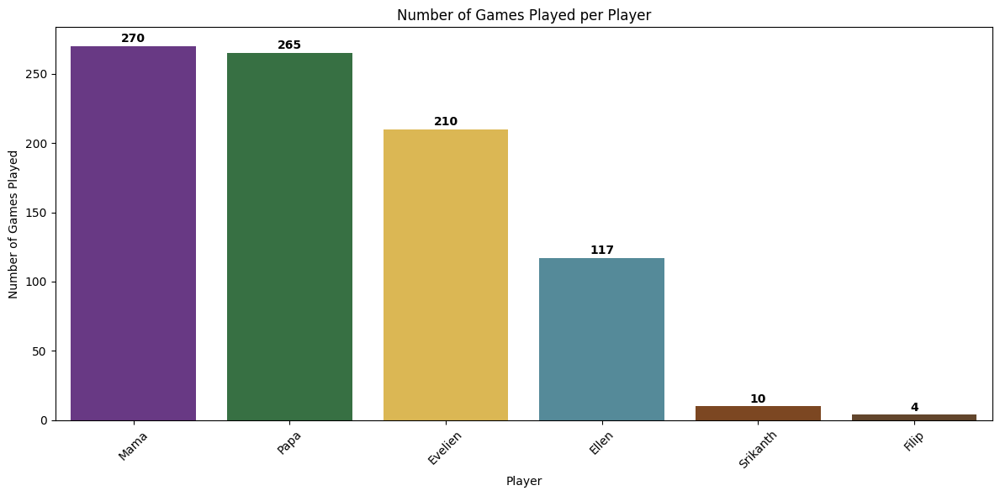

In [41]:
import seaborn as sns
import matplotlib.pyplot as plt

# Use the same color mapping as in file_context_0

players = []
games_played = []
bar_colors = []

for player in important_players_colors.keys():
    if player in number_of_games_per_player:
        players.append(player)
        games_played.append(number_of_games_per_player[player])
        bar_colors.append(important_players_colors[player])

plt.figure(figsize=(12, 6))
ax = sns.barplot(x=players, y=games_played, palette=bar_colors)
plt.xlabel("Player")
plt.ylabel("Number of Games Played")
plt.title("Number of Games Played per Player")
plt.xticks(rotation=45)

# Add the number on top of each bar
for i, v in enumerate(games_played):
    ax.text(i, v + 1, str(v), color='black', ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()

In [42]:
# First, group by game_idx and aggregate the players in each game
grouped = combined_df.groupby('game_idx')['multi_player'].apply(lambda x: ','.join(x.unique()))

# Find games where 'Mama' is not present in any player's name
games_without_mama = grouped[~grouped.str.contains('Mama')]

print(f"Number of games without 'Mama': {len(games_without_mama)}")
print("Games without 'Mama' and their players:")
for idx, players in games_without_mama.items():
    print(f"Game idx: {idx}, Players: {players}")


Number of games without 'Mama': 7
Games without 'Mama' and their players:
Game idx: 2, Players: Jeff,Linda,Moutine?,Nico,Empty
Game idx: 14, Players: Evelien,Ellen,Papa
Game idx: 115, Players: Ellen,Papa
Game idx: 149, Players: Nico,Papa
Game idx: 193, Players: Wolf,PJ,Ellen
Game idx: 232, Players: Jeff,Evelien
Game idx: 267, Players: Ellen,Evelien


{'Ellen': 0.41,
 'Evelien': 0.39,
 'Filip': 0.0,
 'Mama': 0.24,
 'Papa': 0.31,
 'Srikanth': 0.0}


/var/folders/rk/2mwt_wg11_g2pz5y3k4_j03h0000gn/T/ipykernel_28831/2967611796.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=players, y=ratios, palette=bar_colors)


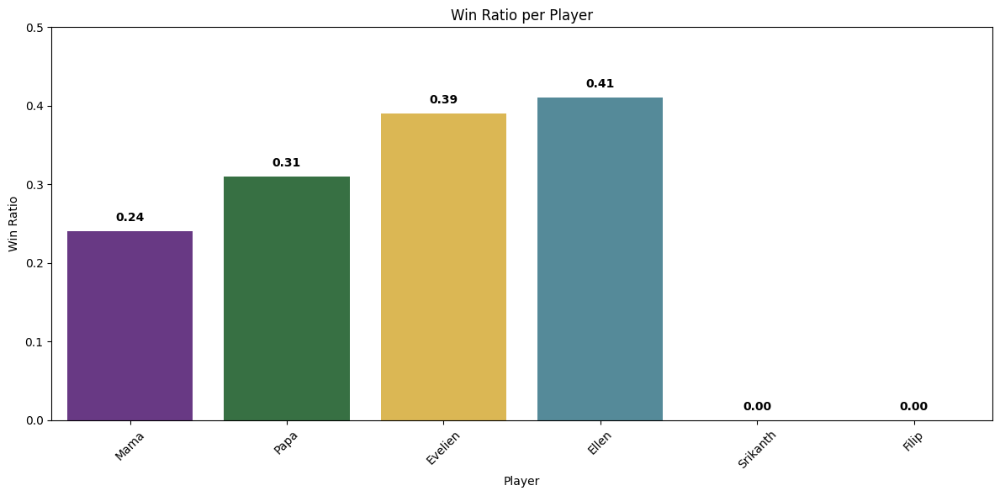

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt

# Use the same important_players_colors as in the previous cell
# Only calculate for important players (those in important_players_colors)
ratio_of_wins_per_player = {}

for player in important_players_colors.keys():
    games = number_of_games_per_player.get(player, 0)
    wins = number_of_wins_per_player.get(player, 0)
    if games > 0:
        ratio = wins / games
        # Cap at 0.5 (50%)
        ratio = min(ratio, 0.5)
        # Round to two decimal points
        ratio = round(ratio, 2)
    else:
        ratio = 0.0
    ratio_of_wins_per_player[player] = ratio

from pprint import pprint
pprint(ratio_of_wins_per_player)

# Plotting the capped win ratios for important players using the specified colors
players = list(ratio_of_wins_per_player.keys())
ratios = list(ratio_of_wins_per_player.values())
bar_colors = [important_players_colors[player] for player in players]

plt.figure(figsize=(12, 6))
ax = sns.barplot(x=players, y=ratios, palette=bar_colors)
plt.xlabel("Player")
plt.ylabel("Win Ratio")
plt.title("Win Ratio per Player")
plt.ylim(0, 0.5)
plt.xticks(rotation=45)

# Add the ratio on top of each bar
for i, v in enumerate(ratios):
    ax.text(i, v + 0.01, f"{v:.2f}", color='black', ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()


In [44]:
#highest point per category

# vogels 
highest_vogels_points_idx = combined_df["vogels"].idxmax()
highest_vogels_player = combined_df.iloc[highest_vogels_points_idx]["multi_player"]
highest_vogels_points = combined_df.iloc[highest_vogels_points_idx]["vogels"]

print(highest_vogels_player, highest_vogels_points)

Mama 63.0


In [45]:
# bonuskaarten
highest_bonuskaarten_points_idx = combined_df["bonuskaarten"].idxmax()
highest_bonuskaarten_player = combined_df.iloc[highest_bonuskaarten_points_idx]["multi_player"]
highest_bonuskaarten_points = combined_df.iloc[highest_bonuskaarten_points_idx]["bonuskaarten"]

print(highest_bonuskaarten_player, highest_bonuskaarten_points)

Evelien 30.0


In [46]:
# einde_ronde_doelen  eieren  voedsel_op_kaarten  weggestopte_kaarten  totaal  game_idx

# einde_ronde_doelen
highest_einde_ronde_doelen_points_idx = combined_df["einde_ronde_doelen"].idxmax()
highest_einde_ronde_doelen_player = combined_df.iloc[highest_einde_ronde_doelen_points_idx]["multi_player"]
highest_einde_ronde_doelen_points = combined_df.iloc[highest_einde_ronde_doelen_points_idx]["einde_ronde_doelen"]

print(highest_einde_ronde_doelen_player, highest_einde_ronde_doelen_points)

Papa 22.0


In [47]:
# eieren
highest_eieren_points_idx = combined_df["eieren"].idxmax()
highest_eieren_player = combined_df.iloc[highest_eieren_points_idx]["multi_player"]
highest_eieren_points = combined_df.iloc[highest_eieren_points_idx]["eieren"]

print(highest_eieren_player, highest_eieren_points)

Evelien 30.0


In [48]:
# voedsel_op_kaarten
highest_voedsel_op_kaarten_points_idx = combined_df["voedsel_op_kaarten"].idxmax()
highest_voedsel_op_kaarten_player = combined_df.iloc[highest_voedsel_op_kaarten_points_idx]["multi_player"]
highest_voedsel_op_kaarten_points = combined_df.iloc[highest_voedsel_op_kaarten_points_idx]["voedsel_op_kaarten"]

print(highest_voedsel_op_kaarten_player, highest_voedsel_op_kaarten_points)

Mama 19.0


In [49]:
# weggestopte_kaarten
highest_weggestopte_kaarten_points_idx = combined_df["weggestopte_kaarten"].idxmax()
highest_weggestopte_kaarten_player = combined_df.iloc[highest_weggestopte_kaarten_points_idx]["multi_player"]
highest_weggestopte_kaarten_points = combined_df.iloc[highest_weggestopte_kaarten_points_idx]["weggestopte_kaarten"]

print(highest_weggestopte_kaarten_player, highest_weggestopte_kaarten_points)

Ellen 33.0


In [50]:
# totaal
highest_totaal_points_idx = combined_df["totaal"].idxmax()
highest_totaal_player = combined_df.iloc[highest_totaal_points_idx]["multi_player"]
highest_totaal_points = combined_df.iloc[highest_totaal_points_idx]["totaal"]

print(highest_totaal_player, highest_totaal_points)

Ellen 111.0


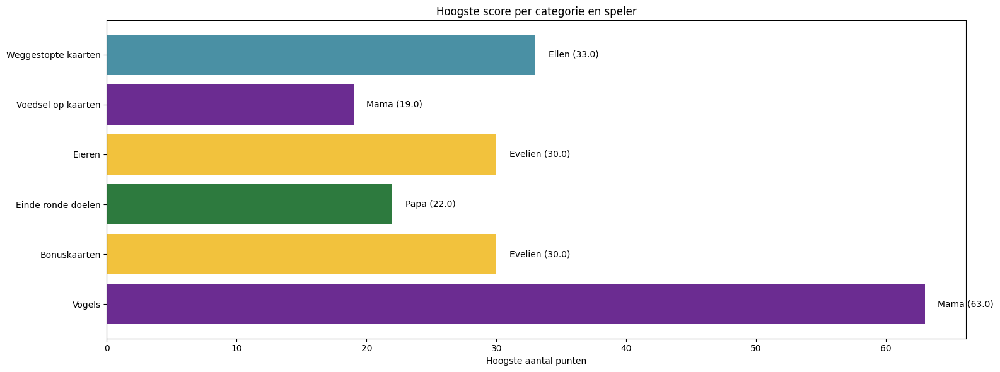

In [51]:
import matplotlib.pyplot as plt

# Use the same color mapping as in the rest of the notebook


# Prepare data for the horizontal bar chart
categories = [
    "Vogels",
    "Bonuskaarten",
    "Einde ronde doelen",
    "Eieren",
    "Voedsel op kaarten",
    "Weggestopte kaarten"
]
points = [
    highest_vogels_points,
    highest_bonuskaarten_points,
    highest_einde_ronde_doelen_points,
    highest_eieren_points,
    highest_voedsel_op_kaarten_points,
    highest_weggestopte_kaarten_points
]
players = [
    highest_vogels_player,
    highest_bonuskaarten_player,
    highest_einde_ronde_doelen_player,
    highest_eieren_player,
    highest_voedsel_op_kaarten_player,
    highest_weggestopte_kaarten_player
]

# Assign colors based on the player who won each category
bar_colors = []
for player in players:
    color = important_players_colors.get(player, "#cccccc")  # fallback to grey if not found
    bar_colors.append(color)

fig, ax = plt.subplots(figsize=(16, 6))
bars = ax.barh(categories, points, color=bar_colors)

# Annotate each bar with the player name and points
for bar, player, point in zip(bars, players, points):
    ax.text(
        bar.get_width() + 1,
        bar.get_y() + bar.get_height() / 2,
        f"{player} ({point})",
        va='center'
    )

ax.set_xlabel("Hoogste aantal punten")
ax.set_title("Hoogste score per categorie en speler")
plt.tight_layout()
plt.show()


Games with tied highest scores (only Mama, Papa, Ellen, Evelyn):

Game 18 (tied score: 69.0):
multi_player  totaal
        Papa    69.0
       Ellen    69.0

Game 34 (tied score: 75.0):
multi_player  totaal
        Papa    75.0
     Evelien    75.0

Game 50 (tied score: 85.0):
multi_player  totaal
        Papa    85.0
     Evelien    85.0

Game 77 (tied score: 76.0):
multi_player  totaal
        Papa    76.0
       Ellen    76.0

Game 87 (tied score: 82.0):
multi_player  totaal
     Evelien    82.0
       Ellen    82.0

Game 93 (tied score: 85.0):
multi_player  totaal
       Ellen    85.0
        Papa    85.0

Game 103 (tied score: 77.0):
multi_player  totaal
     Evelien    77.0
        Papa    77.0

Game 106 (tied score: 72.0):
multi_player  totaal
        Mama    72.0
       Ellen    72.0

Game 116 (tied score: 83.0):
multi_player  totaal
        Mama    83.0
       Ellen    83.0

Game 129 (tied score: 72.0):
multi_player  totaal
       Ellen    72.0
        Papa    72.0

Game 153 (

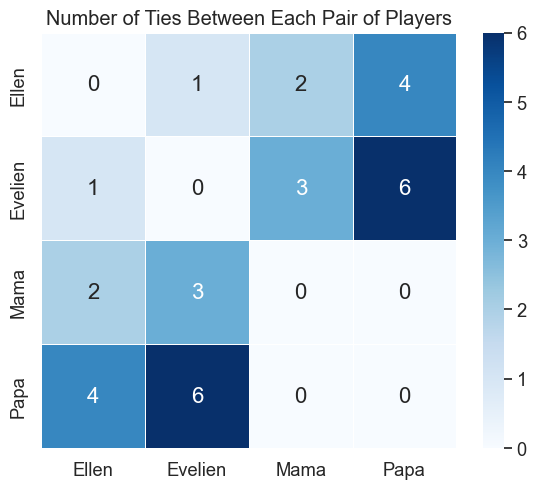

Saved tie grid as 'score_tie_grid.png'.


In [64]:
# Score Ties !

# Only consider 'Mama', 'Papa', 'Ellen', and 'Evelyn'
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

core_players = ['Mama', 'Papa', 'Ellen', 'Evelien']
filtered_df = combined_df[combined_df["multi_player"].isin(core_players)]

if "game_idx" in filtered_df.columns:
    # Group by game
    grouped = filtered_df.groupby("game_idx")
    tied_games = []

    # For the grid
    players = sorted(core_players)
    tie_grid = pd.DataFrame(0, index=players, columns=players)

    for game_idx, group in grouped:
        max_score = group["totaal"].max()
        players_with_max = group[group["totaal"] == max_score]
        if len(players_with_max) > 1:
            tied_games.append((game_idx, max_score, players_with_max[["multi_player", "totaal"]]))
            # Update the grid for each pair of tied players
            tied_player_names = players_with_max["multi_player"].tolist()
            for i in range(len(tied_player_names)):
                for j in range(i + 1, len(tied_player_names)):
                    p1 = tied_player_names[i]
                    p2 = tied_player_names[j]
                    tie_grid.loc[p1, p2] += 1
                    tie_grid.loc[p2, p1] += 1  # symmetric

    if tied_games:
        print("Games with tied highest scores (only Mama, Papa, Ellen, Evelyn):")
        for game_idx, max_score, players in tied_games:
            print(f"\nGame {game_idx} (tied score: {max_score}):")
            print(players.to_string(index=False))
        print("\nGrid of number of ties between each pair of players:")
        print(tie_grid)
    else:
        print("No games with tied highest scores found (for Mama, Papa, Ellen, Evelyn).")
        print("\nGrid of number of ties between each pair of players (all zeros):")
        print(tie_grid)

    # Make the grid as a nice PNG
    plt.figure(figsize=(6, 5))
    sns.set(font_scale=1.2)
    ax = sns.heatmap(
        tie_grid,
        annot=True,
        fmt="d",
        cmap="Blues",
        cbar=True,
        linewidths=0.5,
        square=True,
        annot_kws={"size": 16}
    )
    plt.title("Number of Ties Between Each Pair of Players")
    plt.tight_layout()
    plt.savefig("score_tie_grid.png", dpi=200)
    plt.show()
    print("Saved tie grid as 'score_tie_grid.png'.")
else:
    print("No 'game_idx' column found in the dataframe. Cannot compute score ties.")


In [75]:

# Find the games where the difference between the highest and lowest score is the smallest

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

if "game_idx" in combined_df.columns:
    game_score_diffs = (
        combined_df.groupby("game_idx")["totaal"]
        .agg(["max", "min"])
        .assign(diff=lambda x: x["max"] - x["min"])
    )

    min_diff = game_score_diffs["diff"].min()
    closest_games = game_score_diffs[game_score_diffs["diff"] == min_diff]

    # Collect all closest games' player/score tables (without storing game_idx in the table)
    closest_games_tables = []
    for game_idx in closest_games.index:
        game_players = combined_df[combined_df["game_idx"] == game_idx][["multi_player", "totaal"]]
        game_players = game_players.rename(columns={"multi_player": "Player", "totaal": "Score"})
        closest_games_tables.append((game_idx, game_players))

    if closest_games_tables:
        # Create a directory for the tables if it doesn't exist
        output_dir = "closest_games_tables"
        os.makedirs(output_dir, exist_ok=True)

        for game_idx, game_df in closest_games_tables:
            fig, ax = plt.subplots(figsize=(4, 0.7 + 0.5 * len(game_df)))
            ax.axis('off')
            # Prepare cell colors: header row + data rows
            n_rows = len(game_df) + 1  # +1 for header
            n_cols = len(game_df.columns)
            header_color = "#1976d2"
            data_color = "#e3f0fc"
            # The first row is header, rest are data
            cell_colours = [[header_color] * n_cols] + [[data_color] * n_cols for _ in range(len(game_df))]
            tbl = ax.table(
                cellText=[list(game_df.columns)] + game_df.values.tolist(),
                loc='center',
                cellLoc='center',
                cellColours=cell_colours
            )
            tbl.auto_set_font_size(False)
            tbl.set_fontsize(13)
            tbl.scale(1, 1.3)
            # Style header and data
            for (row, col), cell in tbl.get_celld().items():
                if row == 0:
                    cell.set_text_props(weight='bold', color='white')
                    cell.set_facecolor(header_color)
                else:
                    cell.set_facecolor(data_color)
            # Remove the Score Diff heading
            plt.tight_layout()
            filename = os.path.join(output_dir, f"closest_game_{game_idx}.png")
            plt.savefig(filename, dpi=200, bbox_inches='tight', transparent=True)
            plt.close()
            print(f"Saved closest game table for Game {game_idx} as '{filename}'.")
    else:
        print("No closest games found.")
else:
    print("No 'game_idx' column found in the dataframe. Cannot compute closest games.")


Saved closest game table for Game 34 as 'closest_games_tables/closest_game_34.png'.
Saved closest game table for Game 43 as 'closest_games_tables/closest_game_43.png'.
Saved closest game table for Game 88 as 'closest_games_tables/closest_game_88.png'.
Saved closest game table for Game 95 as 'closest_games_tables/closest_game_95.png'.
Saved closest game table for Game 98 as 'closest_games_tables/closest_game_98.png'.
Saved closest game table for Game 114 as 'closest_games_tables/closest_game_114.png'.
Saved closest game table for Game 143 as 'closest_games_tables/closest_game_143.png'.
Saved closest game table for Game 174 as 'closest_games_tables/closest_game_174.png'.
Saved closest game table for Game 221 as 'closest_games_tables/closest_game_221.png'.


In [54]:
# Number of games where a player has exactly 100 points, grouped by player

if "multi_player" in combined_df.columns and "totaal" in combined_df.columns:
    # Filter rows where player scored exactly 100 points
    df_exact_100 = combined_df[combined_df["totaal"] == 100]

    # Group by player and count the number of such games
    player_100_counts = (
        df_exact_100.groupby("multi_player")
        .size()
        .reset_index(name="num_games_with_100")
    )

    print("Number of games where each player scored exactly 100 points:")
    for _, row in player_100_counts.iterrows():
        print(f"{row['multi_player']}: {row['num_games_with_100']} games")

    # Optionally, print the games and players for reference
    if not df_exact_100.empty:
        print("\nGames where a player scored exactly 100 points:")
        for game_idx, group in df_exact_100.groupby("game_idx"):
            print(f"\nGame {game_idx}:")
            print(group[["multi_player", "totaal"]].to_string(index=False))
else:
    print("Required columns not found in the dataframe.")


Number of games where each player scored exactly 100 points:
Ellen: 1 games
Evelien: 2 games
Papa: 1 games

Games where a player scored exactly 100 points:

Game 58:
multi_player  totaal
     Evelien   100.0

Game 111:
multi_player  totaal
     Evelien   100.0

Game 158:
multi_player  totaal
        Papa   100.0

Game 255:
multi_player  totaal
       Ellen   100.0


Players with 100 or more points in a game:
Ellen: 5 times, points: [111.0, 102.0, 105.0, 100.0, 103.0]
Evelien: 5 times, points: [100.0, 100.0, 106.0, 101.0, 104.0]
Mama: 3 times, points: [101.0, 103.0, 101.0]
Papa: 5 times, points: [102.0, 101.0, 103.0, 100.0, 107.0]


/var/folders/rk/2mwt_wg11_g2pz5y3k4_j03h0000gn/T/ipykernel_28831/1609971756.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


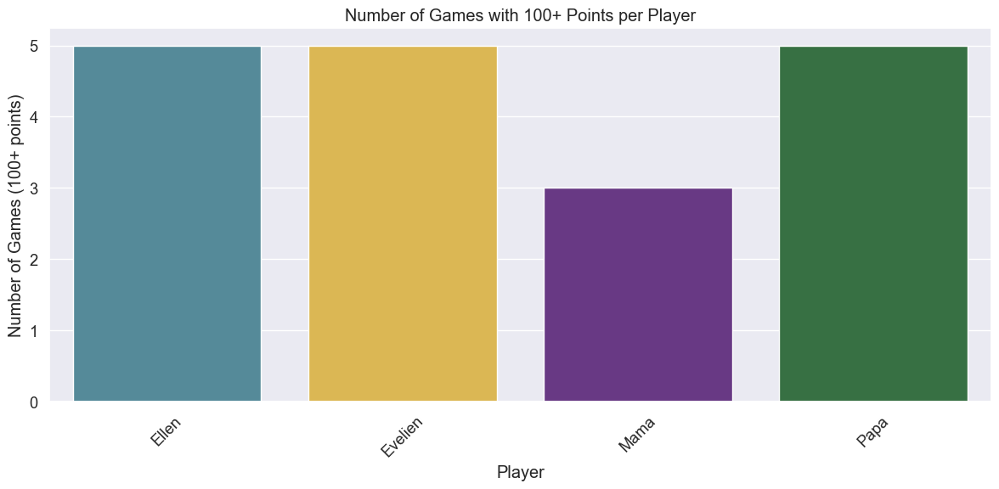

In [76]:
# Group by player and count number of games with 100 or more points, and list the points
import matplotlib.pyplot as plt
import seaborn as sns

if "multi_player" in combined_df.columns and "totaal" in combined_df.columns:
    # Filter rows where player scored 100 or more points
    df_100_or_more = combined_df[combined_df["totaal"] >= 100]

    # Group by player, count, and collect list of points
    player_stats = (
        df_100_or_more.groupby("multi_player")["totaal"]
        .agg(number_count="count", points_list=lambda x: list(x))
        .reset_index()
    )

    print("Players with 100 or more points in a game:")
    for _, row in player_stats.iterrows():
        print(f"{row['multi_player']}: {row['number_count']} times, points: {row['points_list']}")

    # Prepare bar colors using important_players_colors, fallback to a default color if not found
    bar_colors = [
        important_players_colors.get(player, "#cccccc") for player in player_stats["multi_player"]
    ]

    plt.figure(figsize=(12, 6))
    ax = sns.barplot(
        x=player_stats["multi_player"],
        y=player_stats["number_count"],
        palette=bar_colors
    )
    ax.set_title("Number of Games with 100+ Points per Player")
    ax.set_xlabel("Player")
    ax.set_ylabel("Number of Games (100+ points)")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
else:
    print("Required columns not found in the dataframe.")


/var/folders/rk/2mwt_wg11_g2pz5y3k4_j03h0000gn/T/ipykernel_28831/1357671936.py:63: UserWarning: Glyph 127942 (\N{TROPHY}) missing from font(s) Arial.
  plt.tight_layout()
/Users/srikanthganta/personal/wingspan/.venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 127942 (\N{TROPHY}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


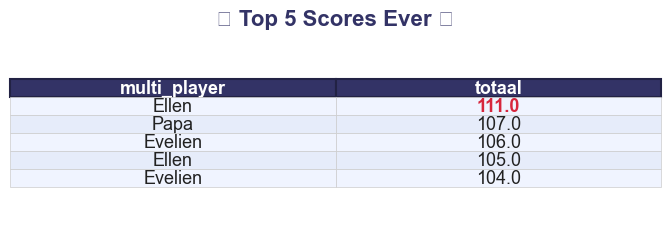

In [82]:
# Show a prettier table with the top 5 scores ever using matplotlib

import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colors as mcolors

# Sort the dataframe by 'totaal' in descending order and get the top 5 scores
top_5_scores = (
    combined_df.sort_values(by='totaal', ascending=False)
    .head(5)[['multi_player', 'totaal']]
    .reset_index(drop=True)
)

# Set up the matplotlib figure
fig, ax = plt.subplots(figsize=(7, 2.5))
ax.axis('off')
ax.set_title("🏆 Top 5 Scores Ever 🏆", fontsize=16, pad=18, color="#333366", weight='bold')

# Define pretty colors for rows (alternating) and header
header_color = "#333366"
row_colors = ["#f0f4ff", "#e6ecfa"]

# Create the table using matplotlib's table function
table = ax.table(
    cellText=top_5_scores.values,
    colLabels=top_5_scores.columns,
    cellLoc='center',
    loc='center'
)

# Style the table
table.auto_set_font_size(False)
table.set_fontsize(13)
table.scale(1.25, 1.25)

# Set header style and row background colors
for (row, col), cell in table.get_celld().items():
    if row == 0:
        cell.set_text_props(weight='bold', color='white')
        cell.set_facecolor(header_color)
        cell.set_linewidth(0)
    else:
        cell.set_facecolor(row_colors[(row-1) % len(row_colors)])
        cell.set_linewidth(0)
        if col == 1:
            # Highlight the highest score
            if row == 1:
                cell.set_text_props(weight='bold', color='#d7263d')
            else:
                cell.set_text_props(color='#222222')
        else:
            cell.set_text_props(color='#222222')

# Add a border around the table
for col in range(len(top_5_scores.columns)):
    table[(0, col)].set_linewidth(1.5)
    table[(0, col)].set_edgecolor("#222244")
for row in range(1, len(top_5_scores) + 1):
    for col in range(len(top_5_scores.columns)):
        table[(row, col)].set_linewidth(0.5)
        table[(row, col)].set_edgecolor("#cccccc")

plt.tight_layout()
plt.show()


In [81]:
# Find the row with the highest score ever
highest_score_row = combined_df.loc[combined_df['totaal'].idxmax()]

print("Game with the highest score ever:")
print(highest_score_row)


Game with the highest score ever:
multi_player           Ellen
vogels                  43.0
bonuskaarten            21.0
einde_ronde_doelen      10.0
eieren                   9.0
voedsel_op_kaarten       6.0
weggestopte_kaarten     22.0
totaal                 111.0
game_idx                 100
Name: 332, dtype: object


In [56]:
# Show highest average score per player (only for players with more than 5 games played), in descending order

# Count number of games per player
games_played = combined_df.groupby("multi_player")["totaal"].count()

# Filter players with more than 5 games
eligible_players = games_played[games_played > 5].index

# Calculate average score per eligible player
average_scores = (
    combined_df[combined_df["multi_player"].isin(eligible_players)]
    .groupby("multi_player")["totaal"]
    .mean()
    .sort_values(ascending=False)
)

if not average_scores.empty:
    print("Average scores per player (min 6 games), descending order:")
    for player, avg_score in average_scores.items():
        print(f"{player}: {avg_score:.2f}")
else:
    print("No player has more than 5 games played.")


Average scores per player (min 6 games), descending order:
Ellen: 79.61
Evelien: 77.94
Papa: 75.00
Mama: 73.90
Srikanth: 67.80
Empty: 0.00


In [57]:
# List of top 5 scores ever

# Sort the dataframe by 'totaal' in descending order and get the top 5 scores
top_5_scores = combined_df.sort_values(by='totaal', ascending=False).head(5)

# Print the top 5 scores
print("Top 5 scores ever:")
print(top_5_scores[['multi_player', 'totaal']])


Top 5 scores ever:
    multi_player  totaal
332        Ellen   111.0
906         Papa   107.0
404      Evelien   106.0
803        Ellen   105.0
722      Evelien   104.0


In [58]:
# Win with the lowest score ever
# Find the lowest winning score ever
# Assume 'totaal' is the score and 'multi_player' is the player, and 'game_id' is the game identifier

# First, filter out rows where the player is 'Empty' (not a real player)
valid_games = combined_df[combined_df["multi_player"] != "Empty"]

# For each game, find the player(s) with the highest score (the winner(s))
winners = valid_games.loc[valid_games.groupby("game_idx")["totaal"].idxmax()]

# Now, find the winner with the lowest score ever
lowest_win = winners.loc[winners["totaal"].idxmin()]

print("Win with the lowest score ever:")
print(f"Player: {lowest_win['multi_player']}, Score: {lowest_win['totaal']}, Game ID: {lowest_win['game_idx']}")




Win with the lowest score ever:
Player: Evelien, Score: 62.0, Game ID: 20


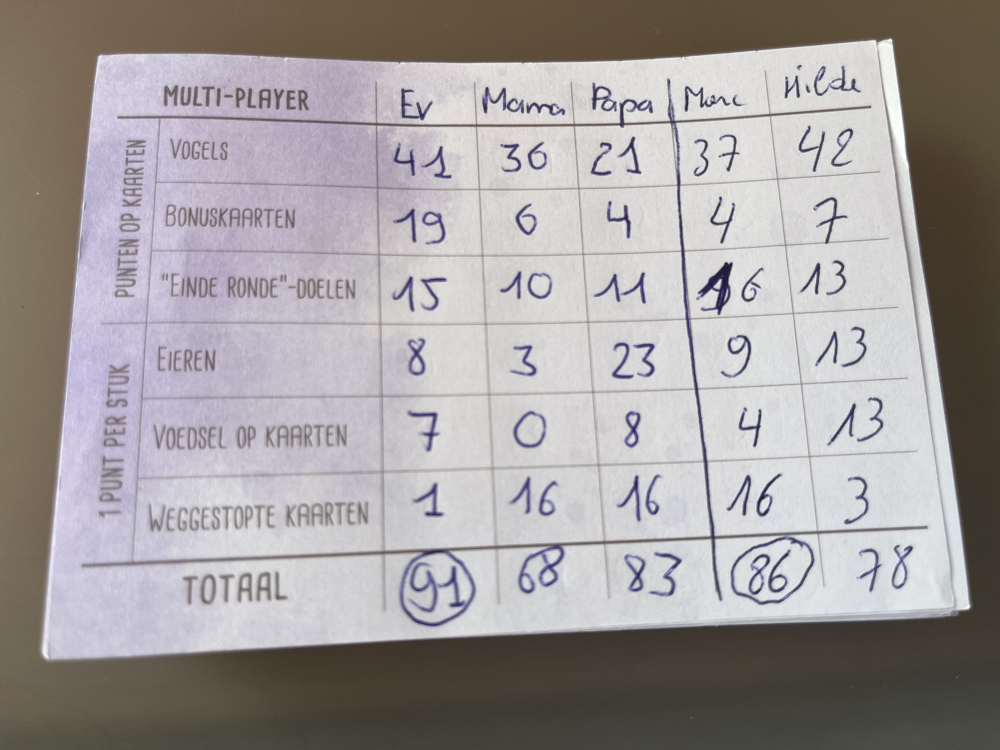

In [59]:
# IMG_9642_rotated
# Stolen Victory

from IPython.display import Image, display

# Show the image inline in the notebook
display(Image(filename='/Users/srikanthganta/personal/wingspan-frontend/input_images/IMG_9642_rotated.png'))

In [60]:
# Need a better calculator:

# IMG_9642_rotated -> 68 mentioned, real 71
# IMG_9714_rotated.json -> 56 mentioned, real 53
# IMG_9727_rotated.json -> Papa -> 58, 70
# IMG_9784_rotated.json -> Papa -> 70, 74 -> 


In [61]:
# IMG_9696_rotated -> Sharing the stage!
# IMG_9718_rotated


In [62]:
    # "IMG_9770_rotated.json": {
    #   "is_valid": true,
    #   "timestamp": "2025-07-17T00:02:26.940882",
    #   "notes": "Split into 2 games. Tried your best but wasn't enough"
    # },

# So close by Ellen by still sad